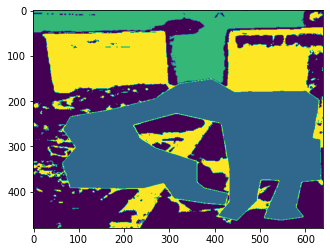

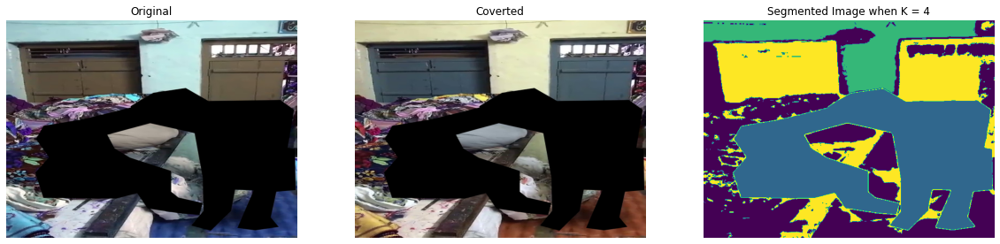

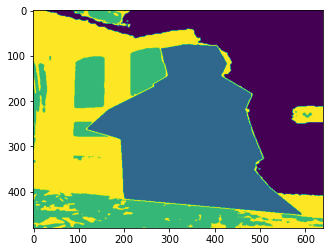

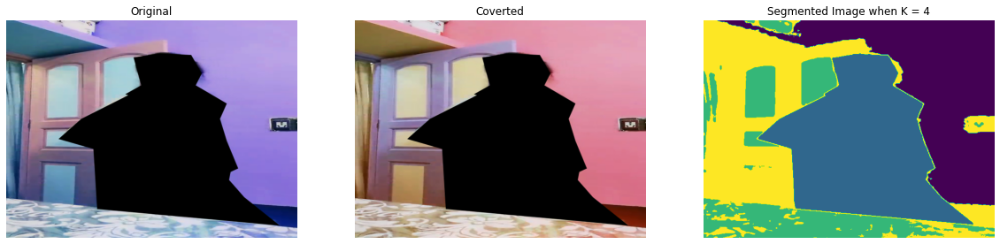

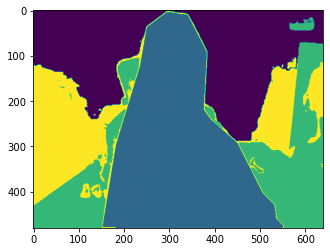

...

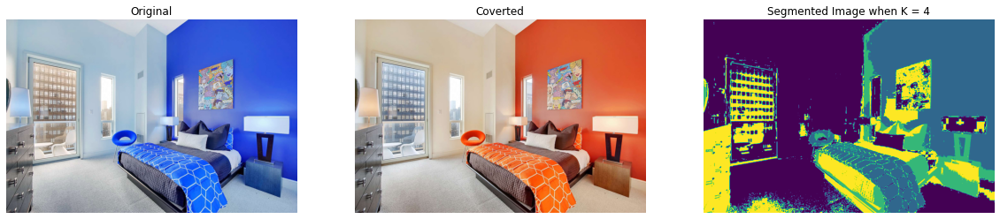

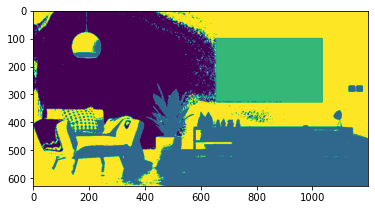

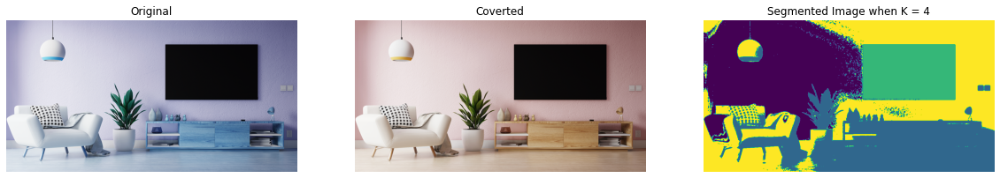

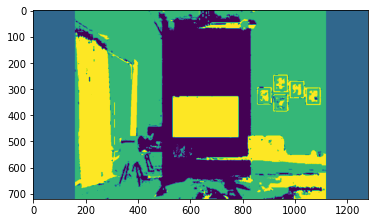

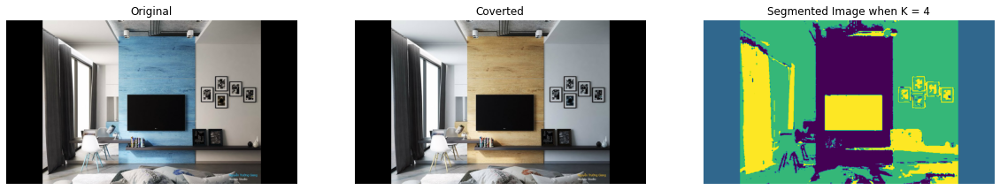

In [2]:

import numpy as np
import cv2
from matplotlib import pyplot as plt
import os

(750, 1334)


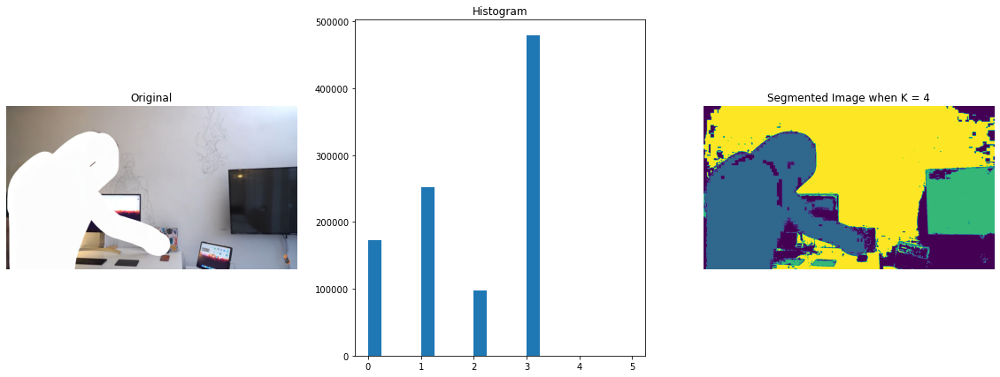

NameError: name 'image' is not defined

In [7]:
# for image in os.listdir('images'):
img_original = cv2.imread(f'images/new10.jpg') 

img_cvt=cv2.cvtColor(img_original,cv2.COLOR_BGR2RGB)

kernel = np.ones((5,5),np.float32)/25
filt_2D = cv2.filter2D(img_cvt,-1,kernel)    #Convolution using the kernel we provide
blur = cv2.blur(img_cvt,(5,5))   #Convolution with a normalized filter. Same as above for this example.
blur_gaussian = cv2.GaussianBlur(img_cvt,(3,3),1)  #Gaussian kernel is used. 
median_blur = median = cv2.medianBlur(img_cvt,7)  #Using kernel size 5. Better on edges compared to gaussian.
bilateral_blur = cv2.bilateralFilter(img_cvt,9,75,75)  #Good for noise removal but retain edge sharpness. 

# Convert MxNx3 image into Kx3 where K=MxN
final_img = img_original.reshape((-1,3))  #-1 reshape means, in this case MxN

from sklearn.mixture import GaussianMixture as GMM

n = 4
#covariance choices, full, tied, diag, spherical
gmm_model = GMM(n_components=n, covariance_type='full', random_state = 0).fit(final_img) 
gmm_labels = gmm_model.predict(final_img)

#Put numbers back to original shape so we can reconstruct segmented image
original_shape = img_cvt.shape
segmented = gmm_labels.reshape(original_shape[0], original_shape[1])
new = np.uint8(segmented)
##plotting histogram
# hist = cv2.calcHist([segmented], [0], None, [10], [0,5])
# plt.plot(hist)
# plt.hist(segmented.ravel(), 20 ,[0,5])
# plt.show()

print(segmented.shape)
#cv2.imwrite("images/segmented.jpg", segmented) 

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20,7))
# Plotting the original image.
ax[0].imshow(img_cvt)
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].hist(segmented.ravel(), 20 ,[0,5])
ax[1].set_title('Histogram')

# # Plotting the segmented image.
# ax[2].imshow(blur_gaussian)
# ax[2].set_title(f'Blurred')
# ax[2].axis('off')

# Plotting the clearly segmented image.
ax[2].imshow(new)
ax[2].set_title(f'Segmented Image when K = {n}')
ax[2].axis('off')


plt.subplots_adjust()
plt.show()
fig.savefig(f'test_gmm/{image}.jpg')

In [ ]:
##plotting
# hist = cv2.calcHist([segmented], [2], None, [256], [0,256])
# plt.plot(hist)
b, g, r = cv2.split(img_cvt)

plt.hist(b.ravel(), 256, [0, 256])
plt.hist(g.ravel(), 256, [0, 256])
plt.hist(r.ravel(), 256, [0, 256])
plt.show()

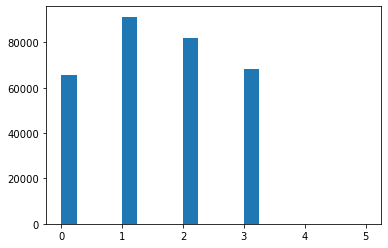

In [34]:
##plotting
# hist = cv2.calcHist([segmented], [0], None, [10], [0,5])
# plt.plot(hist)
plt.hist(segmented.ravel(), 20 ,[0,5])
plt.show()

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20,7))
# Plotting the original image.
ax[0].imshow(median_blur)
ax[0].set_title('Blurred')
ax[0].axis('off')

ax[1].imshow(img_cvt)
ax[1].set_title('Coverted')
ax[1].axis('off')

# # Plotting the segmented image.
# ax[2].imshow(blur_gaussian)
# ax[2].set_title(f'Blurred')
# ax[2].axis('off')

# Plotting the clearly segmented image.
ax[2].imshow(new)
ax[2].set_title(f'Segmented Image when K = {n}')
ax[2].axis('off')


plt.subplots_adjust()
plt.show()
fig.savefig(f'test_gmm/{image}.jpg')


In [48]:
test = np.zeros((segmented.shape), np.uint8)
test

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [49]:
cv2.rectangle(test,(0,100),(200,200),(0),-1)
cv2.rectangle(test,(0,50),(200,200),(50),-1)
cv2.imshow('img',test)
cv2.waitKey(0)
cv2.destroyAllWindows()
test

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

(408, 612)


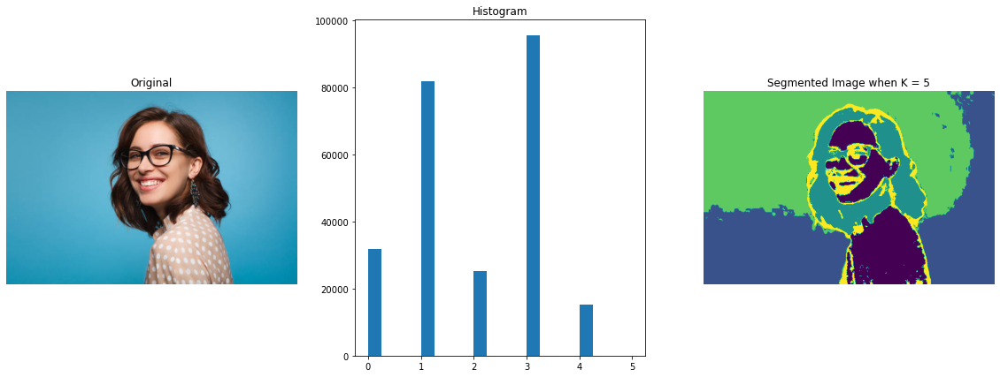

In [29]:
img_original = cv2.imread(f'images/test2.jpg') 

img_cvt=cv2.cvtColor(img_original,cv2.COLOR_BGR2RGB)

kernel = np.ones((5,5),np.float32)/25
filt_2D = cv2.filter2D(img_cvt,-1,kernel)    #Convolution using the kernel we provide
blur = cv2.blur(img_cvt,(5,5))   #Convolution with a normalized filter. Same as above for this example.
blur_gaussian = cv2.GaussianBlur(img_cvt,(3,3),1)  #Gaussian kernel is used. 
median_blur = median = cv2.medianBlur(img_cvt,7)  #Using kernel size 5. Better on edges compared to gaussian.
bilateral_blur = cv2.bilateralFilter(img_cvt,9,75,75)  #Good for noise removal but retain edge sharpness. 

# Convert MxNx3 image into Kx3 where K=MxN
final_img = median.reshape((-1,3))  #-1 reshape means, in this case MxN

from sklearn.mixture import GaussianMixture as GMM

n = 5
#covariance choices, full, tied, diag, spherical
gmm_model = GMM(n_components=n, covariance_type='full', random_state = 0).fit(final_img) 
gmm_labels = gmm_model.predict(final_img)

#Put numbers back to original shape so we can reconstruct segmented image
original_shape = img_cvt.shape
segmented = gmm_labels.reshape(original_shape[0], original_shape[1])
new = np.uint8(segmented)
##plotting histogram
# hist = cv2.calcHist([segmented], [0], None, [10], [0,5])
# plt.plot(hist)
# plt.hist(segmented.ravel(), 20 ,[0,5])
# plt.show()

print(segmented.shape)
#cv2.imwrite("images/segmented.jpg", segmented) 

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20,7))
# Plotting the original image.
ax[0].imshow(img_cvt)
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].hist(segmented.ravel(), 20 ,[0,5])
ax[1].set_title('Histogram')

# # Plotting the segmented image.
# ax[2].imshow(blur_gaussian)
# ax[2].set_title(f'Blurred')
# ax[2].axis('off')

# Plotting the clearly segmented image.
ax[2].imshow(new)
ax[2].set_title(f'Segmented Image when K = {n}')
ax[2].axis('off')


plt.subplots_adjust()
plt.show()


In [ ]:
'''
    0 black
    1 blue
    2 green
    3 yellow
'''

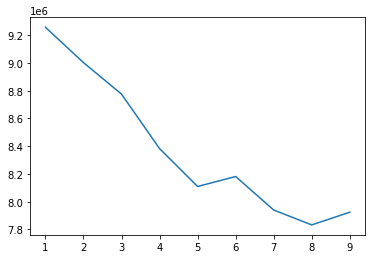

In [33]:
##############################################################
#How to know the best number of components?
#Using Bayesian information criterion (BIC) to find the best number of components
import numpy as np
import cv2

img = cv2.imread("images/image_2.png")
img2 = img.reshape((-1,3))

from sklearn.mixture import GaussianMixture as GMM



#Now, to explain m.bic, here are the lines I used in the video. 
n_components = np.arange(1,10)
gmm_models = [GMM(n, covariance_type='tied').fit(img2) for n in n_components]
plt.plot(n_components, [m.aic(img2) for m in gmm_models], label='AIC')

In [34]:
##############################################################
#How to know the best number of components?
#Using Bayesian information criterion (BIC) to find the best number of components
import numpy as np
import cv2
from sklearn import metrics


img = cv2.imread("images/image_2.png")
img2 = img.reshape((-1,3))
S = []

from sklearn.mixture import GaussianMixture as GMM



#Now, to explain m.bic, here are the lines I used in the video. 
n_components = np.arange(1,5)
gmm_models = [GMM(n, covariance_type='tied').fit(img2) for n in n_components]
gmm_labels = gmm_model.predict(final_img)

 # Calculate Silhoutte Score and append to a list
S.append(metrics.silhouette_score(img2, gmm_models, metric='euclidean'))

# Plot the resulting Silhouette scores on a graph
plt.figure(figsize=(16,8), dpi=300)
plt.plot(n, S, 'bo-', color='black')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Identify the number of clusters using Silhouette Score')
plt.show()

ValueError: Found input variables with inconsistent numbers of samples: [307200, 4]

In [23]:
import numpy as np
import cv2
from sklearn import metrics
from sklearn.mixture import GaussianMixture as GMM
from tqdm import tqdm_notebook as tqdm
from matplotlib import pyplot as plt


# Create empty list
S=[]

# Range of clusters to try (2 to 10)
K=range(2,7)

# Select data for clustering model
img = cv2.imread("images/test1.jpg")
img2 = img.reshape((-1,3))


for k in tqdm(K):
    # Set the model and its parameters
    model = GMM(n_components=k, covariance_type='full', random_state = 0).fit(img2) 
    labels = model.predict(img2)
    # Calculate Silhoutte Score and append to a list
    S.append(metrics.silhouette_score(img2, labels))

# Plot the resulting Silhouette scores on a graph
plt.figure(figsize=(16,8), dpi=300)
plt.plot(K, S, 'bo-', color='black')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Identify the number of clusters using Silhouette Score')
plt.show()

C:\Users\user\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:20: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/5 [00:00<?, ?it/s]

KeyboardInterrupt: 

C:\Users\user\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:21: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/5 [00:00<?, ?it/s]

ValueError: x and y must have same first dimension, but have shapes (5,) and (0,)

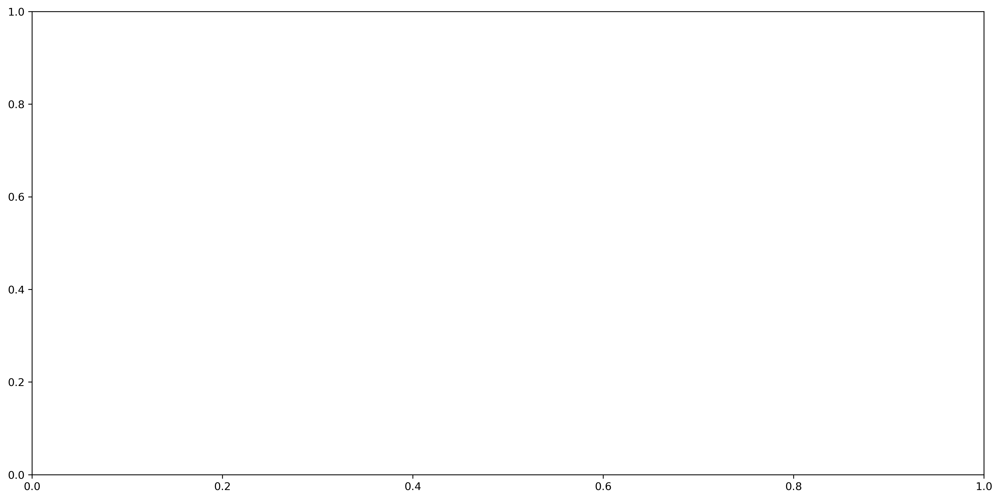

In [24]:
import numpy as np
import cv2
from sklearn import metrics
from sklearn.mixture import GaussianMixture as GMM
from tqdm import tqdm_notebook as tqdm
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Create empty list
sil=[]

# Range of clusters to try (2 to 10)
K=range(2,7)

# Select data for clustering model
img = cv2.imread("images/test2.jpg")
img2 = img.reshape((-1,3))


for k in tqdm(K):
    # Set the model and its parameters
    kmeans = KMeans(n_clusters = k).fit(img2)
    labels = kmeans.labels_
    sil.append(silhouette_score(img2, labels, metric = 'euclidean'))
    # Calculate Silhoutte Score and append to a list



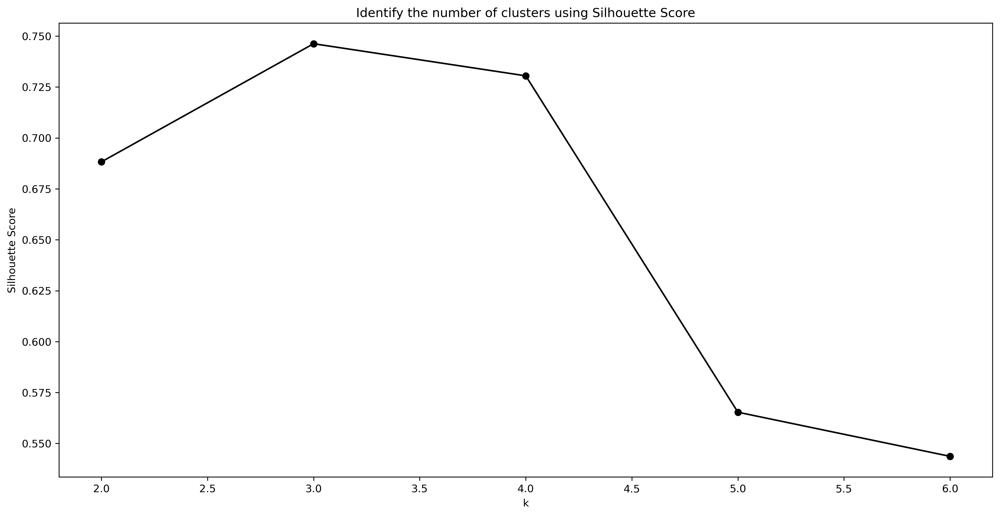

In [25]:
# Plot the resulting Silhouette scores on a graph
plt.figure(figsize=(16,8), dpi=300)
plt.plot(K, sil, 'bo-', color='black')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Identify the number of clusters using Silhouette Score')
plt.show()